# This cat does not exist
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][MS][HW06] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

Цель этого задания - создать котов, которых не существует. В ходе данного задания вы обучите DCGAN и VAE, которые являются одними из первых генеративных моделей. Для этого задания вам наверняка потребуется GPU с CUDA, поэтому рекомендуется использовать Google Colab.

In [ ]:
!unzip '/content/cat_136'

In [2]:
import torch
from torch import nn
from torch.optim import Adam
from torch.nn import functional as F
from torch.utils.data import Dataset, DataLoader
import os 
import cv2
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import random
import numpy as np
from math import log

%matplotlib inline

In [3]:
def random_noise(batch_size, channels, side_size):
    return torch.randn(batch_size, channels, side_size, side_size).cuda()

def imagewide_average(x):
    return x.mean(dim=(-1, -2))

In [4]:
def visualise(imgs, rows=2):
    imgs = (imgs.transpose(1, 3) + 1) / 2
    imgs = torch.cat([imgs[i::rows] for i in range(rows)], dim=1)
    cols = len(imgs)
    imgs = (torch.cat(list(imgs), dim=1)).cpu().numpy()[:, :, ::-1]
    plt.figure(figsize=(cols*1.5, rows*1.5))
    plt.imshow(imgs)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

In [5]:
class CatDataset(Dataset):
    def __init__(self, path_to_dataset="cat_136", size=64):
        self.photo_names = os.listdir(path_to_dataset)
        self.path_base = path_to_dataset
        self.size = size
    
    def __getitem__(self, index):
        path = self.path_base + "/" + self.photo_names[index]
        img = cv2.imread(path) # 136 x 136
        crop_rate = 8
        x_crop = random.randint(0, crop_rate)
        y_crop = random.randint(0, crop_rate)
        img = img[x_crop:136 - crop_rate + x_crop, y_crop:136 - crop_rate + y_crop]
        img = cv2.resize(img, (self.size, self.size), interpolation=cv2.INTER_CUBIC)
        return 2 * torch.tensor(img).float().transpose(0, 2) / 255. - 1
    
    def __len__(self):
        return len(self.photo_names)

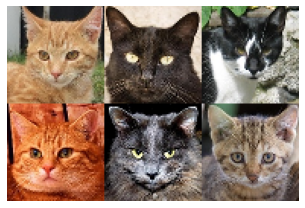

In [99]:
dataset = CatDataset()
visualise(torch.cat([dataset[i].unsqueeze(0) for i in [3, 15, 182, 592, 394, 2941]], dim=0))

### Задание 1 (2 балла)
Для начала реализуем генератор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ConvTranspose2D`, `nn.ReLU`, а также функция `F.interpolate`.

#### Методы
* `__init__` - принимает на вход `start_size`, `latent_channels`, `start_channels` и `upsamplings`. Первые два аргумента отвечают за размер случайного шума, из которого в последствии будет сгенерирована картинка. `start_channels` отвечает за то, сколько каналов должно быть в картинке перед тем, как к ней будут применены upsampling блоки. `upsamplings` - это количество upsampling блоков, которые должны быть применены к картинке. В каждом таком локе количество каналов уменьшается в два раза.


* `forward` - принимает на вход `batch_size`, генерирует `batch_size` картинок из случайного шума.

In [93]:
class Generator(nn.Module):
    def __init__(self, start_size=2, latent_channels=32, start_channels=1024, upsamplings=6):
        super().__init__()
        self.latent_channels = latent_channels
        self.start_size = start_size
        self.start_channels = start_channels
        self.upsamplings = upsamplings

        self.conv1 = nn.Conv2d(self.latent_channels, 
                               self.start_channels, 
                               kernel_size=1, 
                               stride=1,
                               padding=0,
                               bias=False)
        
        list_of_blocks = []
        c = self.start_channels

        for _ in range(self.upsamplings):
            list_of_blocks += [self._conv_block(c, c // 2)]
            c = c // 2
        self.upsampling_blocks = nn.Sequential(*list_of_blocks)

        self.conv2 = nn.Conv2d(in_channels=c,
                               out_channels=3,
                               kernel_size=1,
                               stride=1,
                               padding=0,
                               bias=False)
        
    def _conv_block(self, in_f, out_f):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels = in_f, out_channels = out_f, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_f),
            nn.ReLU()
        )
    
    def forward(self, batch_size: int):
        x = random_noise(batch_size, self.latent_channels, self.start_size)
        x = self.conv1(x)
        x = self.upsampling_blocks(x)
        x = torch.tanh(self.conv2(x))
        return x # torch.Tensor batch_size x 3 x (start_size * 2**upsamplings) x (start_size * 2**upsamplings)

### Задание 2 (2 балла)
Для начала реализуем дискриминатор для нашего DCGAN. Предлагается использовать следующую архитектуру:

![](imgs/Disc_DCGAN.png)

Для ее реализации вам потребуются модули `nn.BatchNorm2d`, `nn.Conv2d`, `nn.ReLU` и `nn.Sigmoid`.

#### Методы
* `__init__` - принимает на вход `start_channels` и `downsamplings`. `start_channels` определяет количество каналов, которые должны быть в изображении перед применением downsampling блоков.


* `forward` - принимает на вход `x` - тензор с картинками. Возвращает вектор с размерностью `batch_size`.

In [94]:
class Discriminator(nn.Module):
    def __init__(self, downsamplings=6, start_channels=8):
        super().__init__()
        self.downsamplings = downsamplings
        self.start_channels = start_channels

        self.conv1 = nn.Conv2d(
            in_channels=3,
            out_channels=self.start_channels,
            kernel_size=1,
            stride=1,
            padding=0,
            bias=False
        )

        list_of_blocks = []
        c = self.start_channels

        for _ in range(self.downsamplings):
            list_of_blocks += [self._conv_block(c, c*2)]
            c *= 2
        self.downsampling_blocks = nn.Sequential(*list_of_blocks)

        self.fc1 = nn.Linear(in_features=int(self.start_channels * 128 * 128 / (2 ** self.downsamplings)),
                             out_features=1,
                             bias=False)
        
        
    def _conv_block(self, in_f, out_f):
        return nn.Sequential(
            nn.Conv2d(in_f, out_f, kernel_size=3, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(out_f),
            nn.ReLU()
        )
        
    def forward(self, x):
        x = self.conv1(x)
        x = self.downsampling_blocks(x)
        x = torch.flatten(x, start_dim=1)
        x = self.fc1(x)
        x = torch.sigmoid(x)
        return x # torch.Tensor batch_size x 1

In [95]:
def train_gan():
    generator = Generator()
    discriminator = Discriminator()
    epochs = 120
    visualise_every = 10
    batch_size = 8
    generator.cuda()
    discriminator.cuda()
    gen_optim = Adam(generator.parameters(), lr=1e-4, betas=(0.5, 0.999))
    disc_optim = Adam(discriminator.parameters(), lr=1e-4, betas=(0.5, 0.999))

    dataset = CatDataset(size=128)

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        gen_loss_avg = 0
        disc_loss_avg = 0

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            # Positive update
            batch = batch.cuda()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Negative update
            batch = generator(batch_size).detach()
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.zeros_like(pred))
            disc_optim.zero_grad()
            loss.backward()
            disc_optim.step()
            disc_loss_avg += loss.item()

            # Generator update
            batch = generator(batch_size)
            pred = discriminator(batch)
            loss = F.binary_cross_entropy(pred, torch.ones_like(pred))
            gen_optim.zero_grad()
            loss.backward()
            gen_optim.step()
            gen_loss_avg += loss.item()
        
        if (ep + 1) % visualise_every == 0:
            with torch.no_grad():
                visualise(generator(16), rows=4)

        print(f"Epoch {ep+1} | Discriminator loss: {disc_loss_avg / total_batches} | Generator loss: {gen_loss_avg / total_batches}")


Epoch 1 | Discriminator loss: 0.4534457960783906 | Generator loss: 3.838233547551291



Epoch 2 | Discriminator loss: 0.7320040625011005 | Generator loss: 2.697049432937403



Epoch 3 | Discriminator loss: 0.8564589142232485 | Generator loss: 2.230719569584598



Epoch 4 | Discriminator loss: 0.8470768452772396 | Generator loss: 2.240340683956324



Epoch 5 | Discriminator loss: 0.8645287389543069 | Generator loss: 2.1076779446061353



Epoch 6 | Discriminator loss: 0.7819651913675856 | Generator loss: 2.2778491823014266



Epoch 7 | Discriminator loss: 0.7822598076066847 | Generator loss: 2.231734275447656



Epoch 8 | Discriminator loss: 0.7461773167199438 | Generator loss: 2.329350627357175



Epoch 9 | Discriminator loss: 0.6647143042805426 | Generator loss: 2.4940187724665823


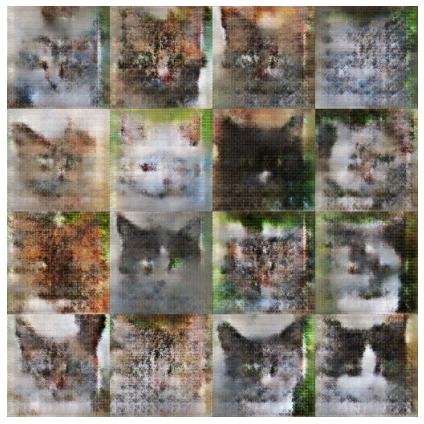

Epoch 10 | Discriminator loss: 0.5891298671174934 | Generator loss: 2.7508190385303144



Epoch 11 | Discriminator loss: 0.5788558113745917 | Generator loss: 2.923215162587462



Epoch 12 | Discriminator loss: 0.5436694860018744 | Generator loss: 2.935854241437053



Epoch 13 | Discriminator loss: 0.5506985967892789 | Generator loss: 2.970279732938879



Epoch 14 | Discriminator loss: 0.4876707676654936 | Generator loss: 3.1925730109214783



Epoch 15 | Discriminator loss: 0.4626363439389442 | Generator loss: 3.171184485280736



Epoch 16 | Discriminator loss: 0.45153824723870145 | Generator loss: 3.427786684091787



Epoch 17 | Discriminator loss: 0.4456111484929205 | Generator loss: 3.437796999254952



Epoch 18 | Discriminator loss: 0.43839027368921285 | Generator loss: 3.4986285661457117



Epoch 19 | Discriminator loss: 0.4113446483202803 | Generator loss: 3.5889813181776438


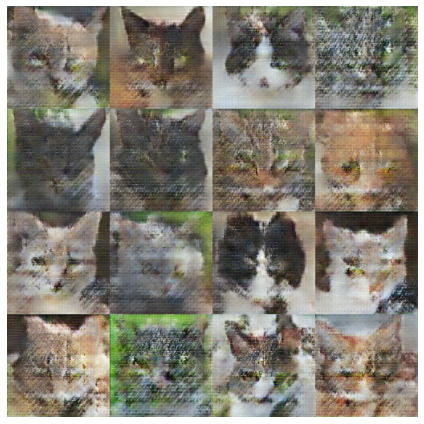

Epoch 20 | Discriminator loss: 0.38795159094401505 | Generator loss: 3.63634563038438



Epoch 21 | Discriminator loss: 0.39990460604307404 | Generator loss: 3.693875712452468



Epoch 22 | Discriminator loss: 0.40275629826230996 | Generator loss: 3.7100553222764168



Epoch 23 | Discriminator loss: 0.3988009377965495 | Generator loss: 3.5790737892344873



Epoch 24 | Discriminator loss: 0.3802447944448578 | Generator loss: 3.748736514900782



Epoch 25 | Discriminator loss: 0.35585250763878046 | Generator loss: 3.8012105263538243



Epoch 26 | Discriminator loss: 0.35831858785844795 | Generator loss: 3.7751967469172447



Epoch 27 | Discriminator loss: 0.342893465662336 | Generator loss: 3.9458732818085585



Epoch 28 | Discriminator loss: 0.3636837817844392 | Generator loss: 3.8597446704132956



Epoch 29 | Discriminator loss: 0.32437182091668565 | Generator loss: 4.098115268516245


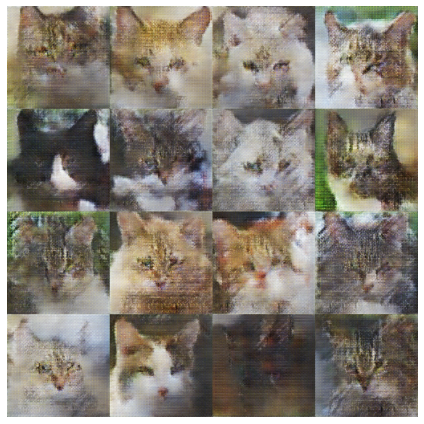

Epoch 30 | Discriminator loss: 0.36123976930904056 | Generator loss: 3.9859762499051064



Epoch 31 | Discriminator loss: 0.3391094280711926 | Generator loss: 3.9314385916320433



Epoch 32 | Discriminator loss: 0.3280433298131362 | Generator loss: 4.05973361765746



Epoch 33 | Discriminator loss: 0.30817419938240664 | Generator loss: 4.1476662605075365



Epoch 34 | Discriminator loss: 0.3316483791757898 | Generator loss: 4.096697934666035



Epoch 35 | Discriminator loss: 0.33130416465907464 | Generator loss: 4.094748247854458



Epoch 36 | Discriminator loss: 0.3108430884168675 | Generator loss: 4.156784704845885



Epoch 37 | Discriminator loss: 0.3358702917570362 | Generator loss: 4.135945027844506



Epoch 38 | Discriminator loss: 0.3686350428610274 | Generator loss: 3.8756891478848012



Epoch 39 | Discriminator loss: 0.3502584731106016 | Generator loss: 3.8695260440896018


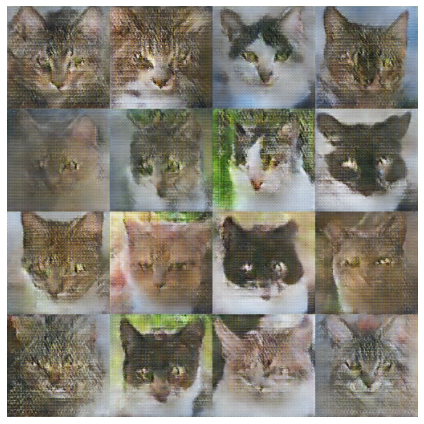

Epoch 40 | Discriminator loss: 0.30103258135003563 | Generator loss: 4.054360887648897



Epoch 41 | Discriminator loss: 0.2736619820457038 | Generator loss: 4.4149982233225185



Epoch 42 | Discriminator loss: 0.280476684576841 | Generator loss: 4.309422782952001



Epoch 43 | Discriminator loss: 0.3176478975688296 | Generator loss: 4.349345838523799



Epoch 44 | Discriminator loss: 0.2993573488201014 | Generator loss: 4.262333018439157



Epoch 45 | Discriminator loss: 0.2669054815953403 | Generator loss: 4.261592644064323



Epoch 46 | Discriminator loss: 0.29691166443937267 | Generator loss: 4.371928080916405



Epoch 47 | Discriminator loss: 0.25866386675489533 | Generator loss: 4.4910782324150205



Epoch 48 | Discriminator loss: 0.29077724203766 | Generator loss: 4.424228079570747



Epoch 49 | Discriminator loss: 0.28496012945402494 | Generator loss: 4.402354611095435


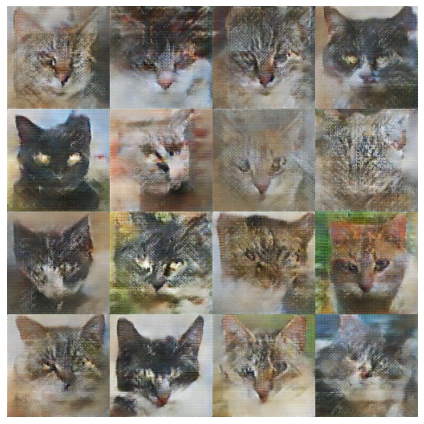

Epoch 50 | Discriminator loss: 0.2660004489589511 | Generator loss: 4.441091788157543



Epoch 51 | Discriminator loss: 0.23558829710817472 | Generator loss: 4.699681418467753



Epoch 52 | Discriminator loss: 0.24544741884355914 | Generator loss: 4.663811079278496



Epoch 53 | Discriminator loss: 0.24000505742711392 | Generator loss: 4.576916212343281



Epoch 54 | Discriminator loss: 0.2500496015826859 | Generator loss: 4.733477508244307



Epoch 55 | Discriminator loss: 0.2648840025354357 | Generator loss: 4.70527071163336



Epoch 56 | Discriminator loss: 0.25389450657789414 | Generator loss: 4.585195293430216



Epoch 57 | Discriminator loss: 0.2540443235871108 | Generator loss: 4.544070615323249



Epoch 58 | Discriminator loss: 0.2434618529038097 | Generator loss: 4.744934998591494



Epoch 59 | Discriminator loss: 0.2353359645239919 | Generator loss: 4.731312461798976


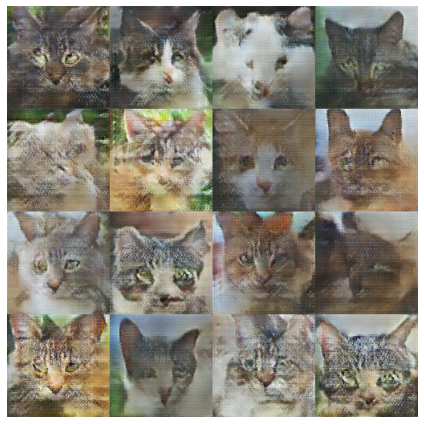

Epoch 60 | Discriminator loss: 0.21483935504917911 | Generator loss: 4.915315172409419



Epoch 61 | Discriminator loss: 0.22581837156582232 | Generator loss: 4.831611681428755



Epoch 62 | Discriminator loss: 0.212684068234835 | Generator loss: 4.824133558349209



Epoch 63 | Discriminator loss: 0.21748477754772041 | Generator loss: 4.800394083841802



Epoch 64 | Discriminator loss: 0.20695319487351288 | Generator loss: 4.93852869685022



Epoch 65 | Discriminator loss: 0.24760609191172525 | Generator loss: 4.8677785771418804



Epoch 66 | Discriminator loss: 0.2186157114327213 | Generator loss: 5.039563059066394



Epoch 67 | Discriminator loss: 0.19967698608893025 | Generator loss: 4.855262795868128



Epoch 68 | Discriminator loss: 0.20478429105603355 | Generator loss: 5.207446622552339



Epoch 69 | Discriminator loss: 0.23560060892751125 | Generator loss: 4.942610362764471


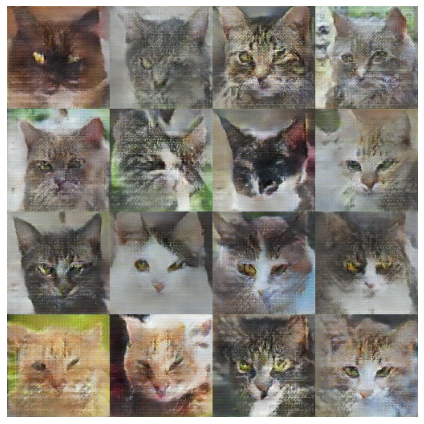

Epoch 70 | Discriminator loss: 0.19223319053116303 | Generator loss: 5.034865619603151



Epoch 71 | Discriminator loss: 0.21096616232260892 | Generator loss: 5.056750697101125



Epoch 72 | Discriminator loss: 0.22380783305447807 | Generator loss: 4.974073353668918



Epoch 73 | Discriminator loss: 0.21473608025358512 | Generator loss: 4.890460988194306



Epoch 74 | Discriminator loss: 0.19578359006208645 | Generator loss: 5.094787053995251



Epoch 75 | Discriminator loss: 0.2067022854980113 | Generator loss: 5.105284626346938



Epoch 76 | Discriminator loss: 0.20640967309623898 | Generator loss: 5.011600167577311



Epoch 77 | Discriminator loss: 0.22134483069721003 | Generator loss: 5.1286964877421815



Epoch 78 | Discriminator loss: 0.2079211842859713 | Generator loss: 5.064798181656725



Epoch 79 | Discriminator loss: 0.19232463574788478 | Generator loss: 5.274045741335946


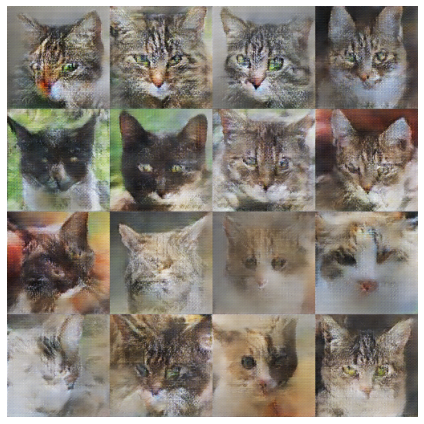

Epoch 80 | Discriminator loss: 0.20943915106399114 | Generator loss: 5.008373411661535



Epoch 81 | Discriminator loss: 0.19823622293992801 | Generator loss: 5.1613015186342395



Epoch 82 | Discriminator loss: 0.19064241609648805 | Generator loss: 5.258174109625521



Epoch 83 | Discriminator loss: 0.17774474913976207 | Generator loss: 5.077457052395211



Epoch 84 | Discriminator loss: 0.18420761969824836 | Generator loss: 5.374865227604505



Epoch 85 | Discriminator loss: 0.18857504252161522 | Generator loss: 5.3510858981135465



Epoch 86 | Discriminator loss: 0.19117116067197404 | Generator loss: 5.298025166581136



Epoch 87 | Discriminator loss: 0.20215379711443748 | Generator loss: 5.29913138667619



Epoch 88 | Discriminator loss: 0.18574830260862096 | Generator loss: 5.137204450665053



Epoch 89 | Discriminator loss: 0.2130504265506032 | Generator loss: 5.2409967460802624


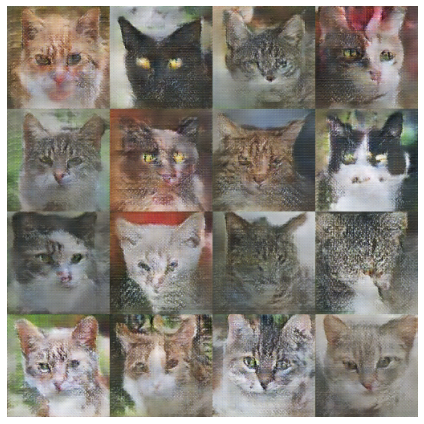

Epoch 90 | Discriminator loss: 0.16938351197266086 | Generator loss: 5.255895626285802



Epoch 91 | Discriminator loss: 0.19350812014772106 | Generator loss: 5.2688274910176025



Epoch 92 | Discriminator loss: 0.1630300783189615 | Generator loss: 5.344811555761728



Epoch 93 | Discriminator loss: 0.16365053160291507 | Generator loss: 5.566889079923955



Epoch 94 | Discriminator loss: 0.19776554828389895 | Generator loss: 5.478650820967943



Epoch 95 | Discriminator loss: 0.19192459601833253 | Generator loss: 5.339764061459103



Epoch 96 | Discriminator loss: 0.14930797553142133 | Generator loss: 5.652539724148578



Epoch 97 | Discriminator loss: 0.1710680767255257 | Generator loss: 5.705923770432887



Epoch 98 | Discriminator loss: 0.18067652340235307 | Generator loss: 5.446073690371484



Epoch 99 | Discriminator loss: 0.17174708061405652 | Generator loss: 5.644167847514893


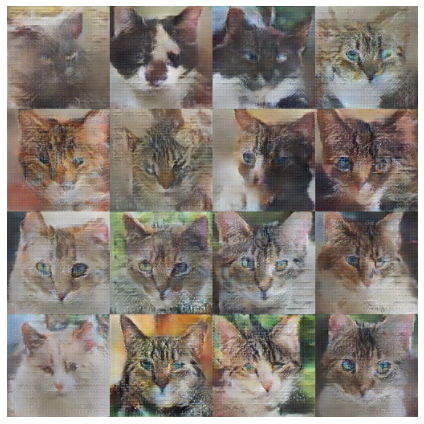

Epoch 100 | Discriminator loss: 0.16049088263731665 | Generator loss: 5.739660403002864



Epoch 101 | Discriminator loss: 0.16942901202934935 | Generator loss: 5.676817751078872



Epoch 102 | Discriminator loss: 0.17620146517542185 | Generator loss: 5.508625553446527



Epoch 103 | Discriminator loss: 0.17132112312378012 | Generator loss: 5.638631257581415



Epoch 104 | Discriminator loss: 0.19058052521088895 | Generator loss: 5.596678995475266



Epoch 105 | Discriminator loss: 0.1453963892654807 | Generator loss: 5.605040270534361



Epoch 106 | Discriminator loss: 0.15235821124573729 | Generator loss: 5.742573506713654



Epoch 107 | Discriminator loss: 0.1808293823999122 | Generator loss: 5.8213842210377225



Epoch 108 | Discriminator loss: 0.15315992460733518 | Generator loss: 5.641413127182063



Epoch 109 | Discriminator loss: 0.17056510213345724 | Generator loss: 5.6172913649807805


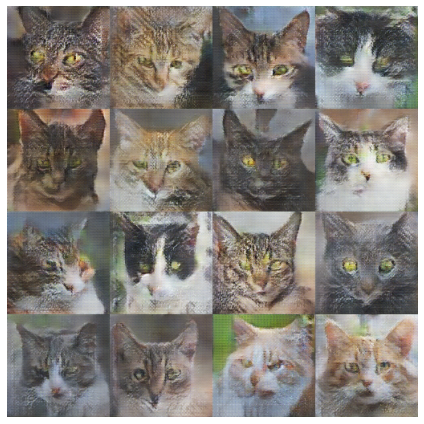

Epoch 110 | Discriminator loss: 0.17299899933937932 | Generator loss: 5.5009773216262365



Epoch 111 | Discriminator loss: 0.1658401899705237 | Generator loss: 5.588366240772031



Epoch 112 | Discriminator loss: 0.15085997920489255 | Generator loss: 5.844749374234158



Epoch 113 | Discriminator loss: 0.1575913958243498 | Generator loss: 5.638340085374643



Epoch 114 | Discriminator loss: 0.15363706197750746 | Generator loss: 5.733084221063934



Epoch 115 | Discriminator loss: 0.1675715530265746 | Generator loss: 5.7931158872124575



Epoch 116 | Discriminator loss: 0.1549121250054834 | Generator loss: 5.8253313623229905



Epoch 117 | Discriminator loss: 0.17769093659222968 | Generator loss: 5.629871257065986



Epoch 118 | Discriminator loss: 0.16381074332457607 | Generator loss: 5.74213628271907



Epoch 119 | Discriminator loss: 0.16701685614573653 | Generator loss: 5.588359060795596


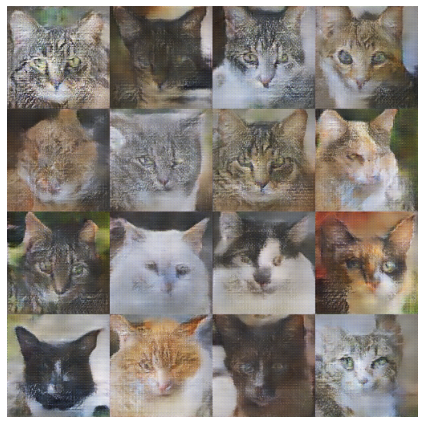

Epoch 120 | Discriminator loss: 0.1431765402515163 | Generator loss: 5.8155772100139105


In [96]:
train_gan()

### Задание 3 (5 баллов)
Теперь посмотрим на другую модель: Variational Autoencoder. В отличии от GAN, в котором генератор пытается себя обмануть дискриминатор, а дискриминатор старается не быть обманутым, VAE решает задачу реконструкции элемента множества X с применением регуляризации в латентном пространстве. 

Полностью архитектура выглядит так:
![](imgs/VAE.png)

Из нее можно выделить две части: Encoder (по изображению возвращает mu и sigma) и Decoder (по случайному шуму восстанавливает изображение). На высоком уровне VAE можно представить так:

![](imgs/VAE_highlevel.png)

В данном задании вам необходимо реализовать полную архитектуру VAE.

#### Методы
* `__init__` - принимает на вход `img_size`, `downsamplings`, `latent_size`, `linear_hidden_size`, `down_channels` и `up_channels`. `img_size` - размер стороны входного изображения. `downsamplings` - количество downsampling (и upsampling) блоков. `latent_size` - размер латентного пространства, в котором в который будет закодирована картинка. `linear_hidden_size` количество нейронов на скрытом слое полносвязной сети в конце encoder'а. Для полносвязной сети decoder'а это число стоит умножить на 2. `down_channels` - количество каналов, в которое будет преобразовано трехцветное изображение перед применением `downsampling` блоков. `up_channels` - количество каналов, которое должно получиться после применения всех upsampling блоков.

* `forward` - принимает на вход `x`. Считает распределение $N(\mu, \sigma^2)$ и вектор $z \sim N(\mu, \sigma^2)$. Возвращает $x'$ - восстановленную из вектора $z$ картинку и $D_{KL}(N(\mu, \sigma^2), N(0, 1)) = 0.5 \cdot (\sigma^2 + \mu^2 - \log \sigma^2 - 1)$.

* `encode` - принимает на вход `x`. Возвращает вектор из распределения $N(\mu, \sigma^2)$.

* `decode` - принимает на вход `z`. Возвращает восстановленную по вектору картинку.


#### Если хочется улучшить качество
https://arxiv.org/pdf/1906.00446.pdf

In [6]:
class VAE(nn.Module):
    def __init__(self, img_size=128, downsamplings=5, latent_size=512, linear_hidden_size=1024, down_channels=8, up_channels=16):
        super().__init__()        

        self.img_size = img_size
        self.downsamplings = int(log(128, 2))
        self.latent_size = latent_size
        self.linear_hidden_size = linear_hidden_size
        self.down_channels = down_channels
        self.up_channels = up_channels

        # encoder
        c = self.down_channels
        modules = []
        for _ in range(self.downsamplings):
            modules += [self._conv_block(c, c * 2)]
            c *= 2

        self.encoder = nn.Sequential(
            nn.Conv2d(3, self.down_channels, 1, 1, 0),
            nn.Sequential(*modules),
            nn.Conv2d(c, 2 * self.latent_size, 1, 1, 0)
        )

        # decoder
        c = self.up_channels * (2 ** self.downsamplings)
        modules = []
        for _ in range(self.downsamplings):
            modules += [self._conv_tr_block(c, c // 2)]
            c = c // 2

        self.decoder = nn.Sequential(
            nn.Conv2d(self.latent_size, self.up_channels * (2 ** self.downsamplings), 1, 1, 0),
            nn.Sequential(*modules),
            nn.Conv2d(self.up_channels, 3, 1, 1, 0),
            nn.Tanh()
        )

    def _conv_block(self, in_f, out_f):
        return nn.Sequential(
            nn.Conv2d(in_f, out_f, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(out_f),
            nn.ReLU()
        )
        
    def _conv_tr_block(self, in_f, out_f):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels = in_f, out_channels = out_f, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(out_f),
            nn.ReLU()
        )
        
    def forward(self, x):
        x = self.encode(x)
        x_pred = self.decode(x)
        kld = 0.5 * (self.std + torch.pow(self.mu, 2) - torch.log(self.std) - 1)
        return x_pred, kld
    
    def encode(self, x):
        x = self.encoder(x)
        self.mu = x[:, :self.latent_size, :, :]
        self.std = x[:, self.latent_size:, :, :]
        self.std = torch.exp(0.5*self.std)
        randn = torch.randn_like(self.std)
        z = self.mu + randn * self.std
        return z
    
    def decode(self, z):
        x_pred = self.decoder(z)
        return x_pred

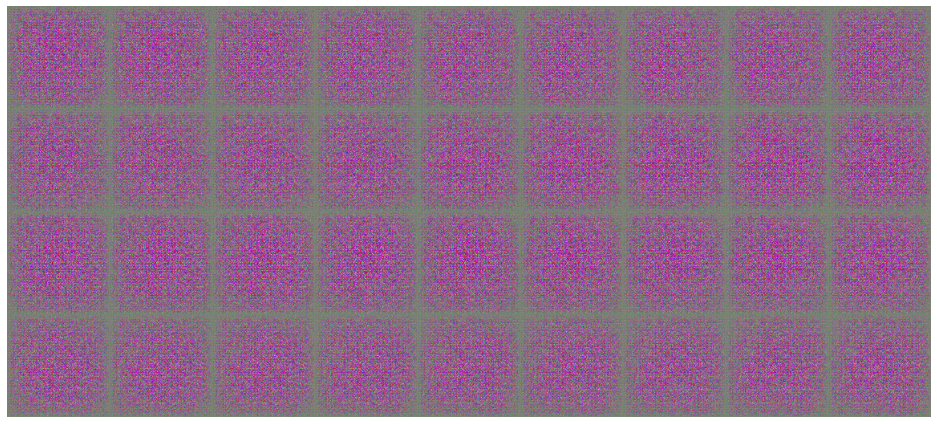

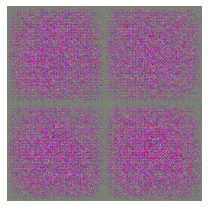


Epoch 1 | Reconstruction loss: 9490.365411793964 | KLD loss: 189.57509509969202



Epoch 2 | Reconstruction loss: 7082.2380424167795 | KLD loss: 270.6382233992867



Epoch 3 | Reconstruction loss: 6592.898575871627 | KLD loss: 316.24855055720167



Epoch 4 | Reconstruction loss: 6252.937051903387 | KLD loss: 343.37528617337625



Epoch 5 | Reconstruction loss: 6044.839080620996 | KLD loss: 369.47008817684576



Epoch 6 | Reconstruction loss: 5877.1523100100685 | KLD loss: 388.4026067034798



Epoch 7 | Reconstruction loss: 5767.560924838049 | KLD loss: 402.1554363084876



Epoch 8 | Reconstruction loss: 5577.1689328021885 | KLD loss: 415.1973998265237



Epoch 9 | Reconstruction loss: 5442.363868855541 | KLD loss: 433.78348237979486



Epoch 10 | Reconstruction loss: 5289.839664814635 | KLD loss: 445.26619421917457


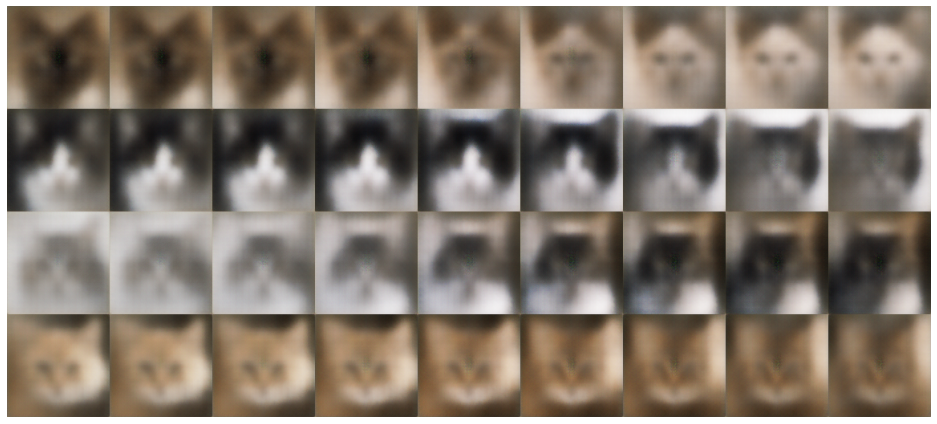

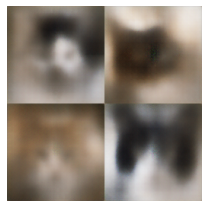


Epoch 11 | Reconstruction loss: 5186.29478122877 | KLD loss: 450.9666708241338



Epoch 12 | Reconstruction loss: 5114.1520696604475 | KLD loss: 452.83995956515673



Epoch 13 | Reconstruction loss: 4994.297577852048 | KLD loss: 455.8812331679445



Epoch 14 | Reconstruction loss: 4956.734368176194 | KLD loss: 455.60041813820783



Epoch 15 | Reconstruction loss: 4864.222204362383 | KLD loss: 461.3088875053832



Epoch 16 | Reconstruction loss: 4788.6992452870245 | KLD loss: 465.2708518934546



Epoch 17 | Reconstruction loss: 4716.891864279042 | KLD loss: 465.9380381803335



Epoch 18 | Reconstruction loss: 4660.230854295055 | KLD loss: 467.7313497318244



Epoch 19 | Reconstruction loss: 4609.9184445209385 | KLD loss: 470.7549553154418



Epoch 20 | Reconstruction loss: 4563.0928071774315 | KLD loss: 473.15531276916124


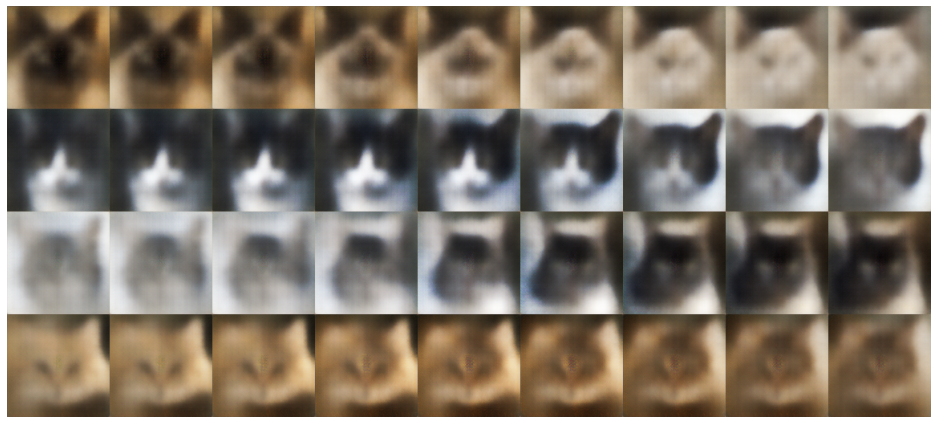

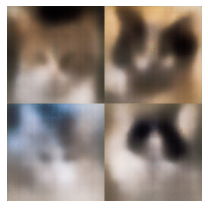


Epoch 21 | Reconstruction loss: 4521.708022218313 | KLD loss: 480.94676180063567



Epoch 22 | Reconstruction loss: 4501.887244562185 | KLD loss: 484.98299009903616



Epoch 23 | Reconstruction loss: 4427.203289908652 | KLD loss: 487.4656889068414



Epoch 24 | Reconstruction loss: 4403.606462372016 | KLD loss: 488.38653256434094



Epoch 25 | Reconstruction loss: 4345.310813003445 | KLD loss: 489.48743092791636



Epoch 26 | Reconstruction loss: 4346.718877756818 | KLD loss: 492.8406698096613



Epoch 27 | Reconstruction loss: 4276.233768818542 | KLD loss: 493.1314302053511



Epoch 28 | Reconstruction loss: 4254.68165161891 | KLD loss: 498.7492706109278



Epoch 29 | Reconstruction loss: 4213.870152443833 | KLD loss: 500.7310938864761



Epoch 30 | Reconstruction loss: 4179.6366994158825 | KLD loss: 501.56960135513214


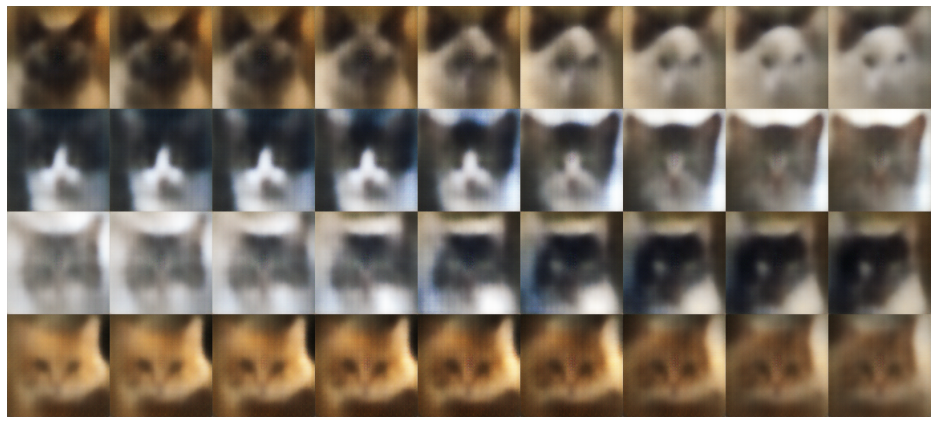

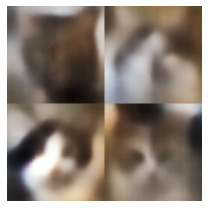


Epoch 31 | Reconstruction loss: 4156.352018936821 | KLD loss: 503.9718385779339



Epoch 32 | Reconstruction loss: 4132.313890540082 | KLD loss: 506.4735935282263



Epoch 33 | Reconstruction loss: 4098.975311089746 | KLD loss: 503.9619804998362



Epoch 34 | Reconstruction loss: 4051.7551061026056 | KLD loss: 506.0596964107537



Epoch 35 | Reconstruction loss: 4028.0180235679104 | KLD loss: 510.707934598745



Epoch 36 | Reconstruction loss: 4016.7162483167945 | KLD loss: 511.6106998135584



Epoch 37 | Reconstruction loss: 3978.032619310462 | KLD loss: 512.7557051285454



Epoch 38 | Reconstruction loss: 3948.0312598566093 | KLD loss: 512.7607164086762



Epoch 39 | Reconstruction loss: 3939.148945115368 | KLD loss: 512.6908996771581



Epoch 40 | Reconstruction loss: 3928.3880365028144 | KLD loss: 516.7408435892614


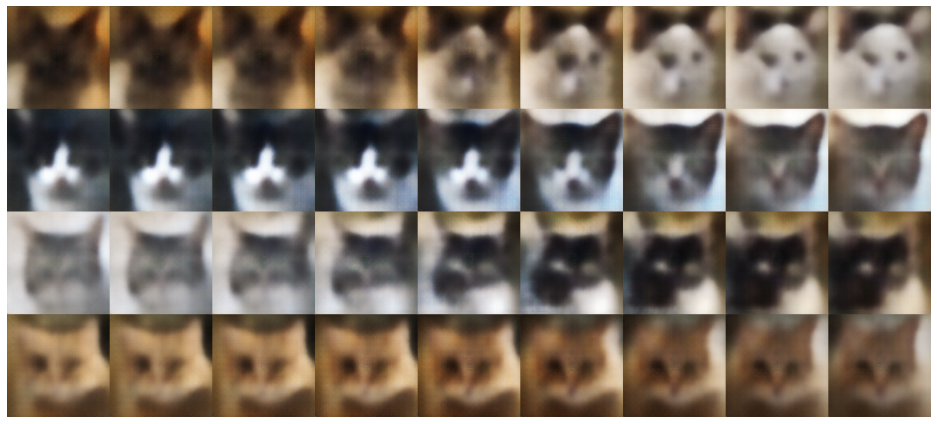

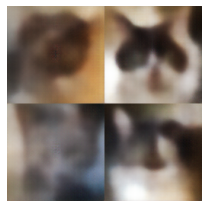


Epoch 41 | Reconstruction loss: 3889.9679334178472 | KLD loss: 520.3306710379464



Epoch 42 | Reconstruction loss: 3890.725022594381 | KLD loss: 521.7015915390867



Epoch 43 | Reconstruction loss: 3860.621805700456 | KLD loss: 520.6082342396612



Epoch 44 | Reconstruction loss: 3848.045451478188 | KLD loss: 519.9530599842901



Epoch 45 | Reconstruction loss: 3840.5625807483743 | KLD loss: 521.2122692795274



Epoch 46 | Reconstruction loss: 3801.168411539208 | KLD loss: 522.954222542899



Epoch 47 | Reconstruction loss: 3807.3335605408092 | KLD loss: 523.0117992614367



Epoch 48 | Reconstruction loss: 3787.3397595897222 | KLD loss: 523.62088751941



Epoch 49 | Reconstruction loss: 3753.9610372033917 | KLD loss: 524.9550252878888



Epoch 50 | Reconstruction loss: 3744.8790468962297 | KLD loss: 525.7984192178857


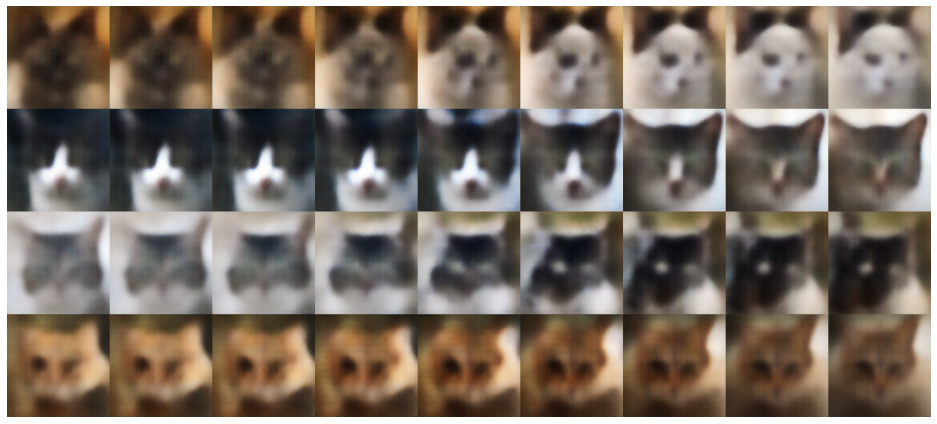

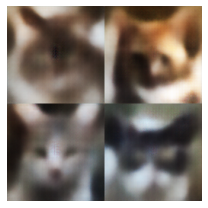


Epoch 51 | Reconstruction loss: 3747.19337036891 | KLD loss: 523.9770569416306



Epoch 52 | Reconstruction loss: 3721.9241192740683 | KLD loss: 524.5589153218714



Epoch 53 | Reconstruction loss: 3698.466209648559 | KLD loss: 527.8400657606421



Epoch 54 | Reconstruction loss: 3685.670685762204 | KLD loss: 527.6373275377736



Epoch 55 | Reconstruction loss: 3686.0953342603602 | KLD loss: 528.5576669444208



Epoch 56 | Reconstruction loss: 3661.792163540858 | KLD loss: 528.7724075317383



Epoch 57 | Reconstruction loss: 3658.592983838194 | KLD loss: 527.9771195879634



Epoch 58 | Reconstruction loss: 3633.060157538941 | KLD loss: 529.6610042027065



Epoch 59 | Reconstruction loss: 3620.6852621706375 | KLD loss: 531.9256821152586



Epoch 60 | Reconstruction loss: 3602.486791006527 | KLD loss: 532.7137851122743


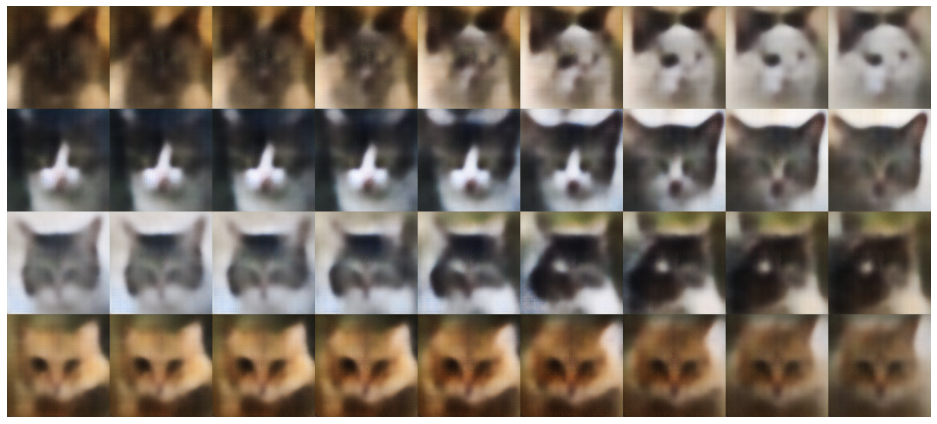

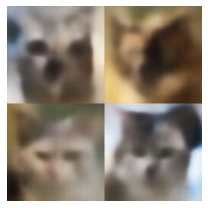


Epoch 61 | Reconstruction loss: 3602.9867364160764 | KLD loss: 533.7981604818972



Epoch 62 | Reconstruction loss: 3589.2498923355006 | KLD loss: 534.2023733861698



Epoch 63 | Reconstruction loss: 3573.0878333808473 | KLD loss: 535.2829298410356



Epoch 64 | Reconstruction loss: 3559.922071373981 | KLD loss: 532.5077129861583



Epoch 65 | Reconstruction loss: 3552.653567865028 | KLD loss: 533.048524370845



Epoch 66 | Reconstruction loss: 3534.3150490707494 | KLD loss: 533.8237721697884



Epoch 67 | Reconstruction loss: 3516.934640446065 | KLD loss: 534.1234211418199



Epoch 68 | Reconstruction loss: 3509.9053170340403 | KLD loss: 533.1630359436414



Epoch 69 | Reconstruction loss: 3501.394732931386 | KLD loss: 531.9926552150561



Epoch 70 | Reconstruction loss: 3492.721834739543 | KLD loss: 534.1012021651179


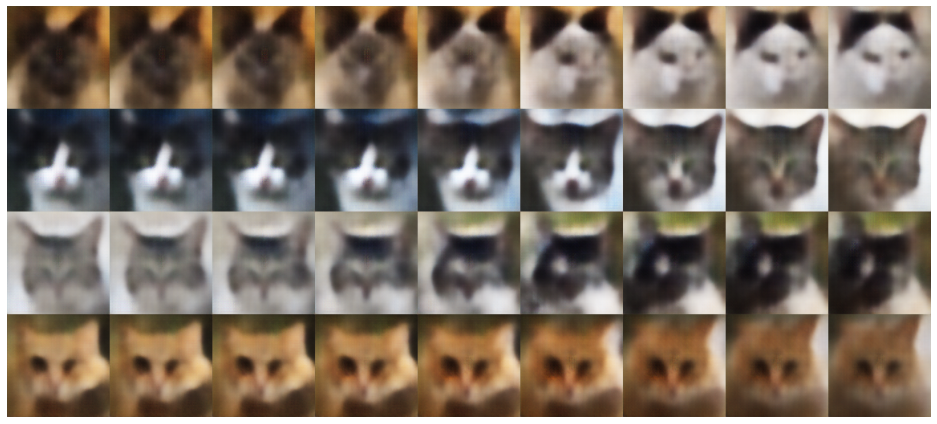

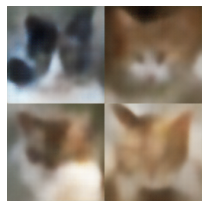


Epoch 71 | Reconstruction loss: 3486.669624660326 | KLD loss: 533.7959339307702



Epoch 72 | Reconstruction loss: 3469.226245572108 | KLD loss: 535.1055383149142



Epoch 73 | Reconstruction loss: 3450.8570784100834 | KLD loss: 534.1133796739282



Epoch 74 | Reconstruction loss: 3457.199524683982 | KLD loss: 536.4643696376255



Epoch 75 | Reconstruction loss: 3441.501992172336 | KLD loss: 535.3911275922882



Epoch 76 | Reconstruction loss: 3433.1344646193224 | KLD loss: 534.2913425990513



Epoch 77 | Reconstruction loss: 3410.940390640164 | KLD loss: 537.7258465216026



Epoch 78 | Reconstruction loss: 3407.9211080799932 | KLD loss: 536.1929543062766



Epoch 79 | Reconstruction loss: 3412.4308282129514 | KLD loss: 537.4689530556246



Epoch 80 | Reconstruction loss: 3404.056766865416 | KLD loss: 535.6074295991696


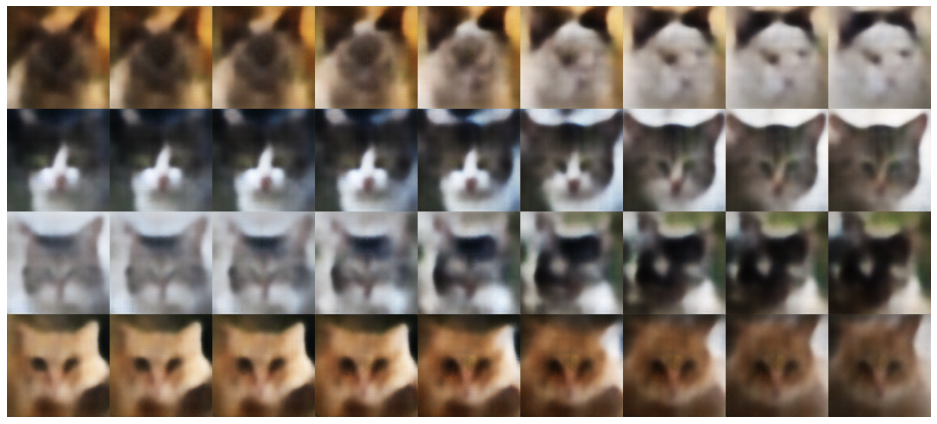

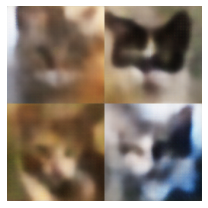


Epoch 81 | Reconstruction loss: 3388.445892902635 | KLD loss: 534.4596471371858



Epoch 82 | Reconstruction loss: 3371.56117637113 | KLD loss: 533.4571687686517



Epoch 83 | Reconstruction loss: 3363.7679667028583 | KLD loss: 536.6697080150154



Epoch 84 | Reconstruction loss: 3344.0323148928815 | KLD loss: 536.4742321227649



Epoch 85 | Reconstruction loss: 3343.419279679008 | KLD loss: 535.4768639795528



Epoch 86 | Reconstruction loss: 3329.8089400581694 | KLD loss: 534.5214825742734



Epoch 87 | Reconstruction loss: 3329.3609395471417 | KLD loss: 537.589969611316



Epoch 88 | Reconstruction loss: 3305.162182920468 | KLD loss: 535.5145272201632



Epoch 89 | Reconstruction loss: 3313.0484022057576 | KLD loss: 534.4358325271132



Epoch 90 | Reconstruction loss: 3307.940870581206 | KLD loss: 534.2174247599537


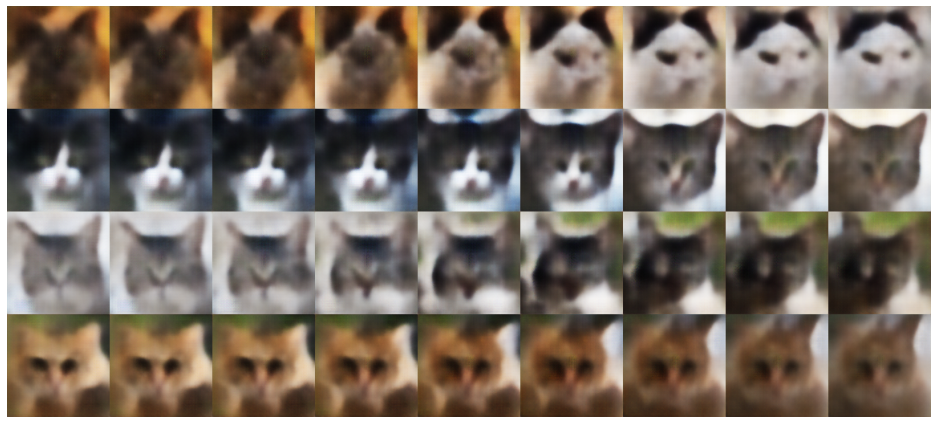

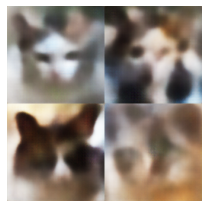


Epoch 91 | Reconstruction loss: 3285.457586821562 | KLD loss: 537.159773785135



Epoch 92 | Reconstruction loss: 3287.525199937524 | KLD loss: 537.9072620557702



Epoch 93 | Reconstruction loss: 3283.9717831818953 | KLD loss: 535.8175352108404



Epoch 94 | Reconstruction loss: 3278.9482376382957 | KLD loss: 537.4354885883213



Epoch 95 | Reconstruction loss: 3251.659077709506 | KLD loss: 535.5503014037328



Epoch 96 | Reconstruction loss: 3255.0456383746605 | KLD loss: 536.7935620894343



Epoch 97 | Reconstruction loss: 3251.887644323503 | KLD loss: 533.4781473763982



Epoch 98 | Reconstruction loss: 3232.469894503955 | KLD loss: 536.706196850131



Epoch 99 | Reconstruction loss: 3235.721562545492 | KLD loss: 535.9442144832256



Epoch 100 | Reconstruction loss: 3228.7551383261357 | KLD loss: 536.5541880352897


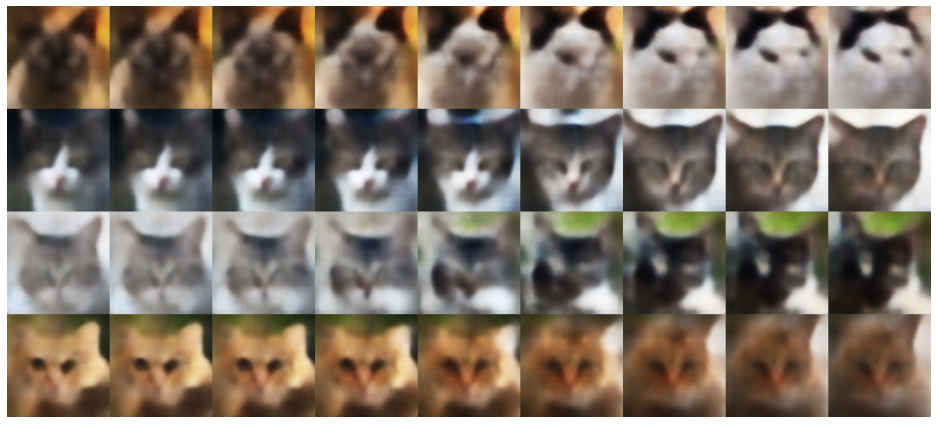

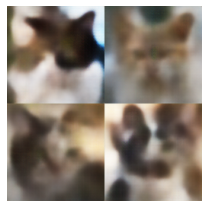


Epoch 101 | Reconstruction loss: 3219.3526783818784 | KLD loss: 535.3469588949073


In [7]:
def train_vae():
    vae = VAE()
    vae.cuda()

    epochs = 101
    batch_size = 8
    vae_optim = Adam(vae.parameters(), lr=1e-4)

    dataset = CatDataset(size=128)

    test_imgs_1 = torch.cat([dataset[i].unsqueeze(0) for i in (0, 34, 76, 1509)])
    test_imgs_2 = torch.cat([dataset[i].unsqueeze(0) for i in (734, 123, 512, 3634)])

    for ep in range(epochs):
        dataloader = DataLoader(dataset, shuffle=True, batch_size=batch_size)
        total_batches = 0
        rec_loss_avg = 0
        kld_loss_avg = 0

        if ep % 10 == 0:
            with torch.no_grad():
                z_1 = vae.encode(test_imgs_1.cuda())
                z_2 = vae.encode(test_imgs_2.cuda())
                x_int = []
                for i in range(9):
                    z = (i * z_1 + (8 - i) * z_2) / 8
                    x_int.append(vae.decode(z))
                x_int = torch.cat(x_int)
                visualise(x_int, rows=len(test_imgs_1))
                z_rand = torch.randn_like(z_1)
                x_int = vae.decode(z_rand)
                visualise(x_int, rows=len(test_imgs_1)//2)

        for i, batch in tqdm(enumerate(dataloader), total=(len(dataset) + batch_size) // batch_size):
            if len(batch) < batch_size:
                continue
            total_batches += 1
            x = batch.cuda()
            x_rec, kld = vae(x)
            img_elems = float(np.prod(list(batch.size())))
            kld_loss = kld.sum() / batch_size
            rec_loss = ((x_rec - x)**2).sum() / batch_size
            loss = rec_loss + 0.1 * kld_loss # https://openreview.net/forum?id=Sy2fzU9gl
            vae_optim.zero_grad()
            loss.backward()
            vae_optim.step()
            kld_loss_avg += kld_loss.item()
            rec_loss_avg += rec_loss.item()

        print(f"Epoch {ep+1} | Reconstruction loss: {rec_loss_avg / total_batches} | KLD loss: {kld_loss_avg / total_batches}")

train_vae()